# Исследование рынка заведений общественного питания Москвы



**Описание**
Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве.
В нашем распоряжении датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.

Нам предстоит подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.




**Описание данных**

Файл moscow_places.csv:

* name — название заведения;
* address — адрес заведения;
* category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
* hours — информация о днях и часах работы;
* lat — широта географической точки, в которой находится заведение;
* lng — долгота географической точки, в которой находится заведение;
* rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
* price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
* avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
   * «Средний счёт: 1000–1500 ₽»;
   * «Цена чашки капучино: 130–220 ₽»;
   * «Цена бокала пива: 400–600 ₽».
   * и так далее;
* middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:

   * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
   * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
   * Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
* middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:

   * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
   * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
   * Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
* chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
   * 0 — заведение не является сетевым
   * 1 — заведение является сетевым
* district — административный район, в котором находится заведение, например Центральный административный округ;
* seats — количество посадочных мест.


<a id='start'></a>

**План работы**

1. <a href='#step_1'>Загрузить и изучить данные</a>  
   1.1. <a href='#step_1_end'>Вывод</a>  
2. <a href='#step_2'>Предобработка данных</a>  
   2.1. <a href='#step_2.1'>Провести предобработку </a>  
      2.1.1. <a href='#step_2.1.1'> name</a>  
      2.1.2. <a href='#step_2.1.2'> category</a>  
      2.1.3. <a href='#step_2.1.3'> address</a>        
      2.1.4. <a href='#step_2.1.4'> district</a>        
      2.1.5. <a href='#step_2.1.5'> hours </a>        
      2.1.6. <a href='#step_2.1.6'> lat,lng </a>      
      2.1.7. <a href='#step_2.1.7'> rating</a>   
      2.1.8. <a href='#step_2.1.8'> price</a>      
      2.1.9. <a href='#step_2.1.9'> avg_bill</a>  
      2.1.10. <a href='#step_2.1.10'> middle_avg_bill</a>  
      2.1.11. <a href='#step_2.1.11'> middle_coffee_cup</a>  
      2.1.12. <a href='#step_2.1.12'> chain</a>        
      2.1.13. <a href='#step_2.1.13'> seats</a>        
   2.2. <a href='#step_2.2'>Добавить дополнительные столбцы</a>  
   2.3. <a href='#step_2_end'>Вывод</a>  
3. <a href='#step_3'>Анализ данных</a>  
   3.1. <a href='#step_3.1'>Распределение заведений по категориям</a>  
   3.2. <a href='#step_3.2'>Исследовать  количество посадочных мест по категориям</a>  
   3.3. <a href='#step_3.3'>Рассмотреть соотношение сетевых и несетевых заведений в датасете</a>  
   3.4. <a href='#step_3.4'>Посмотрим какие категории заведений чаще являются сетевыми</a>      
   3.5. <a href='#step_3.5'>Топ-15 популярных сетей в Москве</a>   
   3.6. <a href='#step_3.6'>Какие административные районы Москвы присутствуют в датасете</a>  
   3.7. <a href='#step_3.7'>Распределение средних рейтингов по категориям заведений</a>   
   3.8. <a href='#step_3.8'>Построим хороплет со средним рейтингом заведений каждого района</a>   
   3.9. <a href='#step_3.9'>Топ-15 улиц по количеству заведений</a>       
   3.10. <a href='#step_3.10'>Найдем улицы, на которых находится только один объект общепита</a>       
   3.11. <a href='#step_3.11'>Выяснить как удалённость от центра влияет на цены в заведениях</a>       
   3.12. <a href='#step_3.12'>Исследуем часы работы заведений и их зависимость от расположения и категории заведения</a>     
   3.13. <a href='#step_3.13'>Исследовать особенности заведений с плохими рейтингами</a>       
   3.14. <a href='#step_3_end'>Вывод</a>    
4. <a href='#step_4'>Детализируем исследование: открытие кофейн</a>  
   4.1. <a href='#step_4.1'>Выяснить сколько всего кофеен в датасете</a>  
   4.2. <a href='#step_4.2'>Узнать есть ли круглосуточные кофейни</a>  
   4.3. <a href='#step_4.3'>Узнать какие у кофеен рейтинги? Как они распределяются по районам?</a>  
   4.4. <a href='#step_4.4'>Определить на какую стоимость чашки капучино стоит ориентироваться при открытии</a>  
   4.5. <a href='#step_4_end'>Вывод   </a>  
5. <a href='#step_5'>Презентация</a>  

6. <a href='#step_6'>Общий вывод</a>  

<a id="step_1"></a>
## Загрузить и изучить данные

In [1]:
# Импорт необходимых библиотек
import pandas as pd
import numpy as np
import math as mth
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import plotly.express as px
!pip install missingno
 
import missingno as msno
from folium  import Map,Marker, Choropleth
# импортируем кластер
from folium.plugins import MarkerCluster
import json

In [2]:
try:
    df = pd.read_csv('/datasets/moscow_places.csv')
except:
    df = pd.read_csv('moscow_places.csv')
    
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Наименования столбцов записаны корректно, отметим, что в данных есть пропуски

In [4]:
#Проверим явные дубликаты
df.duplicated().sum()

0

In [5]:
#посмотрим долю пропусков 
df.isna().mean().sort_values(ascending=False)

middle_coffee_cup    0.936355
middle_avg_bill      0.625387
price                0.605639
avg_bill             0.546039
seats                0.429574
hours                0.063764
name                 0.000000
category             0.000000
address              0.000000
district             0.000000
lat                  0.000000
lng                  0.000000
rating               0.000000
chain                0.000000
dtype: float64

<AxesSubplot:>

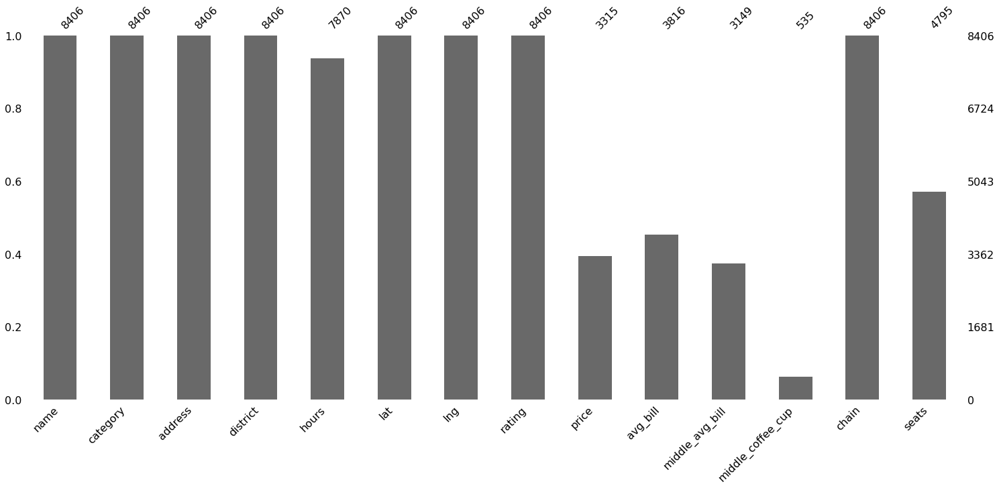

In [6]:
#Визуализируем наши значения, чтобы увидеть, где больше всего пропусков
msno.bar(df)

Пропуски в столбцах: 
* middle_coffee_cup    0.936355
* middle_avg_bill      0.625387
* price                0.605639
* avg_bill             0.546039
* seats                0.429574
* hours                0.063764

In [7]:
# Посмотрим сколько заведений представлено? 

df['name'].value_counts()

Кафе                 189
Шоколадница          120
Домино'с Пицца        76
Додо Пицца            74
One Price Coffee      71
                    ... 
Амбарчик               1
Уютный Дворик          1
Модикум                1
Ветераны фалафеля      1
Эрмитаж                1
Name: name, Length: 5614, dtype: int64

Больше всего заведений с наименованием: кафе

<a id="step_1_end"></a>
### Вывод

В датасете представлены данные из 8406 строки и 14 столбцов, из них уникальных названий заведений 5614.  
В данныех присутствуют пропуски - 6 столбцов. Явные дубликаты отсутствуют.  

Подробнее разберем каждый столбец.

<a href='#start'>Вернуться к оглавлению</a>

<a id="step_2"></a>
## Предобработка данных

In [8]:
#Создадим функцию обработки для просмотра типа данных, пропусков, ошибок
def analysis(column):
    print('тип данных:', df[column].dtypes)
    print()
    print('количество пропусков', df[column].isna().sum())
    print()
    print('доля пропусков', df[column].isna().mean())
    print()
    print('уникальные значения:','\n', df[column].value_counts())
    print()
    if df[column].dtypes != 'object':
        print('описание данных','\n', df[column].describe())
        print()
        print('минимум: ', df[column].min(),'максимум: ', df[column].max() )
       

<a id="step_2.1"></a>
### Провести предобработку 

Мы обнаружили ранее пропуски, теперь посмотрим каждый столбец отдельно

In [9]:
# посмотрим на наименования столбцов
df.columns

Index(['name', 'category', 'address', 'district', 'hours', 'lat', 'lng',
       'rating', 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup',
       'chain', 'seats'],
      dtype='object')

<a id="step_2.1.1"></a>
#### name


In [10]:
analysis('name')

тип данных: object

количество пропусков 0

доля пропусков 0.0

уникальные значения: 
 Кафе                 189
Шоколадница          120
Домино'с Пицца        76
Додо Пицца            74
One Price Coffee      71
                    ... 
Амбарчик               1
Уютный Дворик          1
Модикум                1
Ветераны фалафеля      1
Эрмитаж                1
Name: name, Length: 5614, dtype: int64



In [11]:
sorted(df['name'].unique())

['#КешбэкКафе',
 '+39 Pizzeria Mozzarella bar',
 '1 Этаж',
 '1-я Креветочная',
 '10 Идеальных Пицц',
 '1001 Ночь',
 '100ловая',
 '100лоффка',
 '13',
 '13 Chef doner',
 '15 Kitchen+Bar',
 '15-й Шар',
 '16 Июня',
 '16 Тонн',
 '18 Грамм',
 '1901 Comfort Food Zone',
 '1у',
 '2 Типа',
 '2-й Этаж',
 '2046',
 '21 Век',
 '22 Акра Кофе&Хлеб',
 '2U-Ту-Ю',
 '3 Ступени',
 '351 Bar',
 '4 Сезона',
 '4.2. Bar',
 '4/1 Restaurant',
 '42 Coffee Shop',
 '47',
 '495',
 '4friends Coffee',
 '4tuna Cafe&Grill',
 '5 Stars Coffee',
 '55.709201, 37.392257',
 '6 Am Bread Kitchen',
 '6 Рукопожатий',
 '69 раков',
 '7 Сэндвичей',
 '7 элемент',
 '7/12',
 '8 Oz',
 '8 Вафель',
 '8 Зёрен',
 '8 Пончиков',
 '800°с Contemporary Steak',
 '8bit Pizza',
 '9 Bar Coffe',
 '9 Bar Coffee',
 '9 Зёрен',
 'A-cafe',
 'ABC Coffee Roasters',
 'ABC coffee roasters',
 'Acai Family',
 'Accent',
 "Adam's Chicken",
 'Adria Mare',
 'Ahava',
 'Air Coffee',
 'Al Halal',
 'Al33 Пиццерия бар Боттега',
 'All Day',
 'Alma',
 'Alternative coffee',

In [12]:
#Приведем к нижнему регистру наименования заведений 
df['name'] = df['name'].str.lower()

In [13]:
# Уберем пробелы в начале и в конце и заменим ё на е, повторно проверим наличие дубликатов
df['name'] = df['name'].str.strip()
df['name'] = df['name'].str.replace('ё','е')

In [14]:
len(df['name'].unique())

5506

Пропусков нет. Повторы, скорее всего, относятся к сетевым заведениям.  Часть заведений просто называется "кафе" без разделения.  
Убрали из данных пробелы в начале и в конце текста, заменили ё на е, привели все к нижнему регистру -в результате сократили количество уникальных значений на 108.

<a href='#start'>Вернуться к оглавлению</a>

<a id="step_2.1.2"></a>

#### category

In [15]:
analysis('category')

тип данных: object

количество пропусков 0

доля пропусков 0.0

уникальные значения: 
 кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64



Представлено 8 категорий заведений, из них чаще всего встречаются: кафе и ресторан. Пропусков нет

<a href='#start'>Вернуться к оглавлению</a>

<a id="step_2.1.3"></a>
#### address

In [16]:
analysis('address')

тип данных: object

количество пропусков 0

доля пропусков 0.0

уникальные значения: 
 Москва, проспект Вернадского, 86В                    28
Москва, Усачёва улица, 26                            26
Москва, площадь Киевского Вокзала, 2                 20
Москва, Ярцевская улица, 19                          20
Москва, Пресненская набережная, 2                    16
                                                     ..
Москва, улица Плещеева, 4А                            1
Москва, улица Куусинена, 8А                           1
Москва, улица Ленинская Слобода, 26, стр. 6           1
Москва, улица Образцова, 22                           1
Москва, Большая Новодмитровская улица, 36, стр. 2     1
Name: address, Length: 5753, dtype: int64



In [17]:
# Заменим ё на е, уберем пробелы в начале и в конце и посмотрим на дубли
df['address'] = df['address'].str.strip()
df['address'] = df['address'].str.replace('ё','е')


In [18]:
len(df['address'].unique())

5753

Присутствуют адреса с большим количеством заведений, скорее всего, торговые центры. Пропусков нет

<a href='#start'>Вернуться к оглавлению</a>

<a id="step_2.1.4"></a>
#### district

In [19]:
analysis('district')

тип данных: object

количество пропусков 0

доля пропусков 0.0

уникальные значения: 
 Центральный административный округ         2242
Северный административный округ             900
Южный административный округ                892
Северо-Восточный административный округ     891
Западный административный округ             851
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: district, dtype: int64



В данных представлены 9 административных районов

<a href='#start'>Вернуться к оглавлению</a>

<a id="step_2.1.5"></a>
#### hours

In [20]:
analysis('hours')

тип данных: object

количество пропусков 536

доля пропусков 0.06376397811087318

уникальные значения: 
 ежедневно, 10:00–22:00                                               759
ежедневно, круглосуточно                                             730
ежедневно, 11:00–23:00                                               396
ежедневно, 10:00–23:00                                               310
ежедневно, 12:00–00:00                                               254
                                                                    ... 
пн-ср 08:00–00:00; чт-сб 08:00–03:00; вс 08:00–00:00                   1
пн-пт 09:00–18:00; сб 09:00–15:00                                      1
пн-чт 11:00–00:00; пт 11:00–14:00; сб 19:00–00:00; вс 11:00–00:00      1
пн-сб 07:00–19:00                                                      1
вт-вс 14:00–22:00                                                      1
Name: hours, Length: 1307, dtype: int64



In [21]:
# заменим часы работы на "неизвестно"
df['hours'] = df['hours'].fillna('неизвестно')
df['hours'].isna().sum()

0

Есть пропуски в данных - 6%, заменим на неизвестно. Наиболее популярные часы работы заведений: ежедневно с 10-22 или круглосуточно

<a href='#start'>Вернуться к оглавлению</a>

<a id="step_2.1.6"></a>
#### lat,lng

In [22]:
analysis('lat')

тип данных: float64

количество пропусков 0

доля пропусков 0.0

уникальные значения: 
 55.805361    3
55.762784    3
55.783477    3
55.746918    3
55.706883    3
            ..
55.761960    1
55.792516    1
55.770445    1
55.761305    1
55.726613    1
Name: lat, Length: 8209, dtype: int64

описание данных 
 count    8406.000000
mean       55.750109
std         0.069658
min        55.573942
25%        55.705155
50%        55.753425
75%        55.795041
max        55.928943
Name: lat, dtype: float64

минимум:  55.573942 максимум:  55.928943


In [23]:
analysis('lng')

тип данных: float64

количество пропусков 0

доля пропусков 0.0

уникальные значения: 
 37.732745    3
37.653027    3
37.574534    3
37.552480    3
37.513952    3
            ..
37.593804    1
37.671945    1
37.613680    1
37.659817    1
37.667622    1
Name: lng, Length: 8258, dtype: int64

описание данных 
 count    8406.000000
mean       37.608570
std         0.098597
min        37.355651
25%        37.538583
50%        37.605246
75%        37.664792
max        37.874466
Name: lng, dtype: float64

минимум:  37.355651 максимум:  37.874466


Пропусков нет, заведения расположены недалеко от центра Москвы.  
moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы  
moscow_lat, moscow_lng = 55.751244, 37.618423

<a href='#start'>Вернуться к оглавлению</a>

<a id="step_2.1.7"></a>
#### rating

In [24]:
analysis('rating')

тип данных: float64

количество пропусков 0

доля пропусков 0.0

уникальные значения: 
 4.3    1513
4.4    1351
4.2    1041
4.1     785
4.5     623
4.0     499
4.7     440
4.6     422
3.9     252
4.9     243
4.8     215
3.8     188
3.7     147
5.0     105
3.6      76
3.5      72
3.4      68
3.3      54
3.2      41
3.1      37
2.9      31
2.8      30
3.0      24
2.6      15
1.1      14
2.5      14
2.3      14
2.2      13
2.4      11
2.7      11
1.3      11
1.4      11
1.0      10
1.7       6
2.1       4
2.0       4
1.9       4
1.6       2
1.8       2
1.5       2
1.2       1
Name: rating, dtype: int64

описание данных 
 count    8406.000000
mean        4.229895
std         0.470348
min         1.000000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

минимум:  1.0 максимум:  5.0


Рейтинг от 1-5, больше всего заведений с рейтингом 4.2-4.4

<a href='#start'>Вернуться к оглавлению</a>

<a id="step_2.1.8"></a>
#### price

In [25]:
analysis('price')

тип данных: object

количество пропусков 5091

доля пропусков 0.605638829407566

уникальные значения: 
 средние          2117
выше среднего     564
высокие           478
низкие            156
Name: price, dtype: int64



In [26]:
df['price'] = df['price'].fillna('неизвестно')
df['price'].isna().sum()

0

В данных 4 категории цен, чаще всего встречаются заведения со средней ценовой категорией.  
В данных 60% пропусков - заменили значение на "неизвестно"

<a href='#start'>Вернуться к оглавлению</a>

<a id="step_2.1.9"></a>
#### avg_bill

In [27]:
analysis('avg_bill')

тип данных: object

количество пропусков 4590

доля пропусков 0.5460385438972163

уникальные значения: 
 Средний счёт:1000–1500 ₽        241
Средний счёт:1500–2000 ₽        120
Средний счёт:300–500 ₽           90
Средний счёт:500–1000 ₽          78
Средний счёт:1500–2500 ₽         68
                               ... 
Средний счёт:от 180 ₽             1
Средний счёт:413 ₽                1
Цена бокала пива:129–319 ₽        1
Цена чашки капучино:80–175 ₽      1
Цена бокала пива:от 149 ₽         1
Name: avg_bill, Length: 897, dtype: int64



В данных 54,6% пропусков, нет данных для заполнения, поэтому оставим как есть

<a href='#start'>Вернуться к оглавлению</a>

<a id="step_2.1.10"></a>
#### middle_avg_bill

In [28]:
analysis('middle_avg_bill')

тип данных: float64

количество пропусков 5257

доля пропусков 0.62538662859862

уникальные значения: 
 1250.0    247
1000.0    175
300.0     148
1500.0    146
400.0     134
         ... 
545.0       1
6000.0      1
345.0       1
1060.0      1
30.0        1
Name: middle_avg_bill, Length: 230, dtype: int64

описание данных 
 count     3149.000000
mean       958.053668
std       1009.732845
min          0.000000
25%        375.000000
50%        750.000000
75%       1250.000000
max      35000.000000
Name: middle_avg_bill, dtype: float64

минимум:  0.0 максимум:  35000.0


In [29]:
#Посмотрим на самые высокие оценки ср.чека
df.sort_values(by='middle_avg_bill',ascending = False).head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
7177,кафе,ресторан,"Москва, Каширское шоссе, 23, стр. 2",Южный административный округ,"ежедневно, круглосуточно",55.657450,37.646665,4.1,высокие,Средний счёт:20000–50000 ₽,35000.0,NaN,0,100.0
730,чойхона,"бар,паб","Москва, Дмитровское шоссе, 95А",Северный административный округ,"ежедневно, 10:00–23:00",55.871497,37.543555,4.4,высокие,Средний счёт:5000–17000 ₽,11000.0,NaN,0,49.0
5481,гости,ресторан,"Москва, шоссе Энтузиастов, 52",Восточный административный округ,"пн,вс 18:00–22:30",55.759088,37.760570,4.1,высокие,Средний счёт:5000–15000 ₽,10000.0,NaN,0,NaN
3882,white rabbit,ресторан,"Москва, Смоленская площадь, 3",Центральный административный округ,"ежедневно, 12:00–00:00",55.747608,37.581248,4.9,высокие,Средний счёт:7000–7500 ₽,7250.0,NaN,0,150.0
3487,800°с contemporary steak,ресторан,"Москва, Большой Патриарший переулок, 6, стр. 1",Центральный административный округ,"ежедневно, 09:00–23:30",55.762708,37.592138,4.7,высокие,Средний счёт:6000–8000 ₽,7000.0,NaN,0,75.0
3396,марио,ресторан,"Москва, улица Климашкина, 17",Центральный административный округ,"ежедневно, 12:00–00:00",55.767792,37.568453,4.5,высокие,Средний счёт:7000 ₽,7000.0,NaN,0,100.0
3518,чайка,ресторан,"Москва, Краснопресненская набережная, 12А",Центральный административный округ,"ежедневно, 12:00–00:00",55.752857,37.556365,4.8,высокие,Средний счёт:5000–8000 ₽,6500.0,NaN,1,250.0
3910,кантинетта антинори,ресторан,"Москва, Денежный переулок, 20",Центральный административный округ,"ежедневно, 12:00–00:00",55.745383,37.586595,4.7,высокие,Средний счёт:6000 ₽,6000.0,NaN,0,80.0
2795,крошка картошка,быстрое питание,"Москва, Щелковское шоссе, вл75",Восточный административный округ,"ежедневно, 10:00–22:00",55.811160,37.799823,4.0,высокие,Средний счёт:1000–10000 ₽,5500.0,NaN,1,NaN
3603,lucky izakaya bar,"бар,паб","Москва, Калашный переулок, 9",Центральный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00...",55.757313,37.599581,4.8,высокие,Средний счёт:5500 ₽,5500.0,NaN,0,NaN


Число с оценкой среднего чека от 0 до 35000. Медиана 750р в заведениях.   
Пропусков 62,5% нет данных для заполнения, поэтому оставим как есть

<a href='#start'>Вернуться к оглавлению</a>

<a id="step_2.1.11"></a>
#### middle_coffee_cup

In [30]:
analysis('middle_coffee_cup')

тип данных: float64

количество пропусков 7871

доля пропусков 0.9363549845348561

уникальные значения: 
 256.0    43
60.0     33
95.0     32
150.0    24
170.0    18
         ..
320.0     1
227.0     1
137.0     1
172.0     1
259.0     1
Name: middle_coffee_cup, Length: 96, dtype: int64

описание данных 
 count     535.000000
mean      174.721495
std        88.951103
min        60.000000
25%       124.500000
50%       169.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

минимум:  60.0 максимум:  1568.0


Число с оценкой одной чашки кофе от 60-1568 р, в данных много пропусков 93,6% , так как нет данных для заполнения, оставим как есть. Медиана и среднее 169р и 175р, соответственно.

<a href='#start'>Вернуться к оглавлению</a>

<a id="step_2.1.12"></a>
#### chain

In [31]:
analysis('chain')

тип данных: int64

количество пропусков 0

доля пропусков 0.0

уникальные значения: 
 0    5201
1    3205
Name: chain, dtype: int64

описание данных 
 count    8406.000000
mean        0.381275
std         0.485729
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         1.000000
Name: chain, dtype: float64

минимум:  0 максимум:  1


 Из данных у нас:  
0 — заведение не является сетевым - 5201  
1 — заведение является сетевым - 3205  


<a href='#start'>Вернуться к оглавлению</a>

<a id="step_2.1.13"></a>
#### seats

In [32]:
analysis('seats')

тип данных: float64

количество пропусков 3611

доля пропусков 0.4295741137282893

уникальные значения: 
 40.0     253
100.0    213
60.0     175
50.0     168
80.0     160
        ... 
600.0      1
268.0      1
61.0       1
236.0      1
33.0       1
Name: seats, Length: 229, dtype: int64

описание данных 
 count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

минимум:  0.0 максимум:  1288.0


Пропусков 42,9%, нет данных для заполнения, поэтому оставим как есть  
Количество посадочных мест от 0 до 1288.  
Медиана и среднее 75 и  108 посадочных мест, соответственно.

<a href='#start'>Вернуться к оглавлению</a>

<a id="step_2.2"></a>
### Добавить дополнительные столбцы

*  столбец street с названиями улиц из столбца с адресом.


У нас  каждый адрес записан в формате "город %название, улица %название, дом %номер", напишем небольшую функцию для извлечения названия улицы. 

In [33]:
# функция для извлечения названия улицы
def street(row):
    address = row['address'].split(', ')
    street = address[1]
    return street

In [34]:
df['street'] = df.apply(street, axis=1)
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,неизвестно,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,неизвестно,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица


* столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)

In [35]:
df['is_24_7'] = df['hours'].str.contains('ежедневно, круглосуточно')

In [36]:
df.tail(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
8403,самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,неизвестно,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,Люблинская улица,True
8404,чайхана sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,неизвестно,NaN,NaN,NaN,1,150.0,Люблинская улица,True
8405,kebab time,кафе,"Москва, Россошанский проезд, 6",Южный административный округ,"ежедневно, круглосуточно",55.598229,37.604702,3.9,неизвестно,NaN,NaN,NaN,0,12.0,Россошанский проезд,True


<a href='#start'>Вернуться к оглавлению</a>

<a id="step_2_end"></a>
### Вывод

Проанализировали каждый столбец:

* name - Пропусков нет. Убрали из данных пробелы в начале и в конце текста, заменили ё на е, привели все к нижнему регистру -в результате сократили количество уникальных значений на 108.  
* category - В данных 8 категорий заведений, из них чаще всего встречаются: кафе и ресторан. Пропусков нет  
* address - Присутствуют адреса с большим количеством заведений, скорее всего, торговые центры. Пропусков нет  
* district - В данных представлены 9 административных районов  
* hours - Есть пропуски в данных - 6%, заменим на неизвестно. Наиболее популярные часы работы заведений: ежедневно с 10-22 или круглосуточно  
* lat,lng - Пропусков нет, заведения расположены недалеко от центра Москвы.  
* rating - Рейтинг от 1-5, больше всего заведений с рейтингом 4.2-4.4  
* price - В данных 4 категории цен, чаще всего встречаются заведения со средней ценовой категорией. В данных 60% пропусков - заменили значение на "неизвестно"  
* avg_bill - В данных 54,6% пропусков, нет данных для заполнения, поэтому оставим как есть  
* middle_avg_bill - Число с оценкой среднего чека от 0 до 35000. Медиана 750р в заведениях. Пропусков 62,5% нет данных для заполнения, поэтому оставим как есть  
* middle_coffee_cup - Число с оценкой одной чашки кофе от 60-1568 р, в данных много пропусков 93,6% , так как нет данных для заполнения, оставим как есть. Медиана и среднее 169р и 175р, соответственно.  
* chain - 0 — заведение не является сетевым - 5201, а 1 — заведение является сетевым - 3205
* seats - Пропусков 42,9%, нет данных для заполнения, поэтому оставим как есть. Количество посадочных мест от 0 до 1288. Медиана и среднее 75 и  108 посадочных мест, соответственно.

Добавили дополнительные столбцы: 

* столбец street с названиями улиц из столбца с адресом.  
* столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)  



<a href='#start'>Вернуться к оглавлению</a>

<a id="step_3"></a>
## Анализ данных


<a id="step_3.1"></a>
### Распределение заведений по категориям

In [37]:
df_category = df.groupby('category')['name'].count().sort_values(ascending=False).reset_index()
df_category.columns = ['category','count']
df_category

,category,count
0,кафе,2378
1,ресторан,2043
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


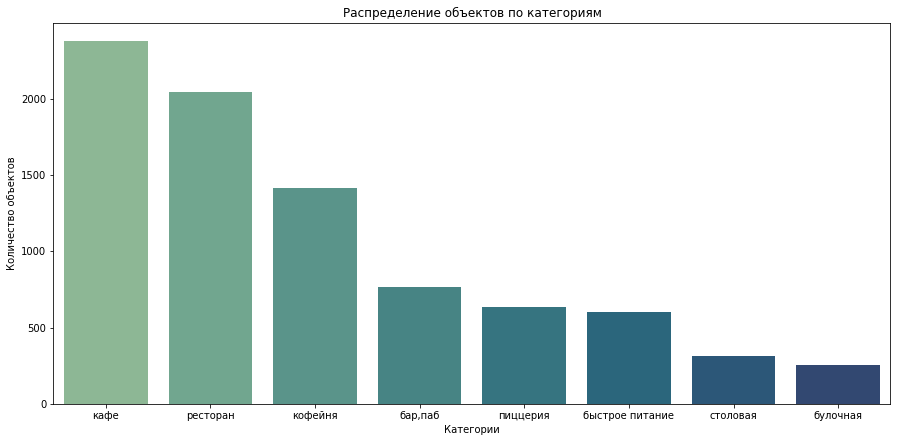

In [38]:
plt.figure(figsize=(15, 7))
sns.barplot(data=df_category, x='category', y='count', palette='crest')
plt.title('Распределение объектов по категориям')
plt.xlabel('Категории')
plt.ylabel('Количество объектов')
plt.show()

**Вывод**

Из анализа распределение заведений по категориям общественного питания к количеству выявлено, что наибольшее количество объектов кафе (2378), ресторан (2043), кофейня(1413), а наименьшее количество у столовых (315) и булочных (256).

<a href='#start'>Вернуться к оглавлению</a>

<a id="step_3.2"></a>
### Исследовать  количество посадочных мест по категориям

In [39]:
category_seats = df.groupby('category')['seats'].count().sort_values(ascending=False).reset_index()
category_seats

,category,seats
0,ресторан,1270
1,кафе,1218
2,кофейня,751
3,"бар,паб",468
4,пиццерия,427
5,быстрое питание,349
6,столовая,164
7,булочная,148


In [40]:
# подсчитаем среднее по категориям
df.groupby('category')['seats'].mean().sort_values(ascending=False).reset_index().round(2)

,category,seats
0,"бар,паб",124.53
1,ресторан,121.94
2,кофейня,111.20
3,столовая,99.75
4,быстрое питание,98.89
5,кафе,97.51
6,пиццерия,94.50
7,булочная,89.39


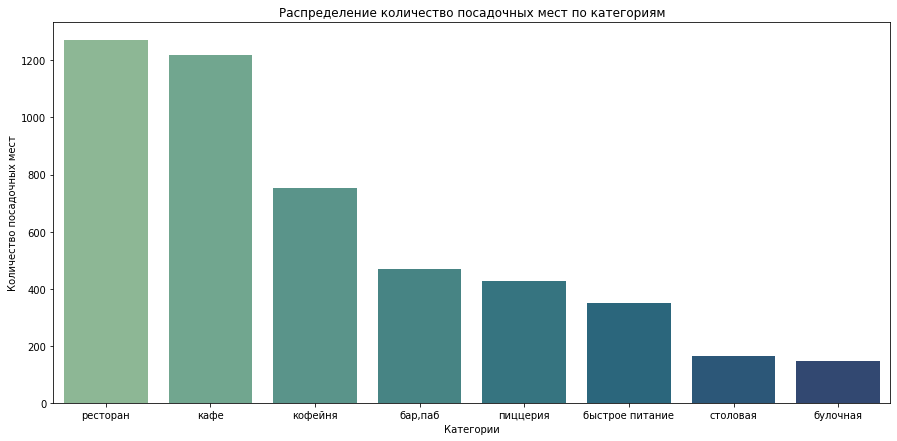

In [41]:
plt.figure(figsize=(15, 7))
sns.barplot(data=category_seats, x='category', y='seats', palette='crest')
plt.title('Распределение количество посадочных мест по категориям')
plt.xlabel('Категории')
plt.ylabel('Количество посадочных мест')
plt.show()

Так как самое большое среднее по категория у "бар, паб", то посмотрим на выбросы по посадочным местам


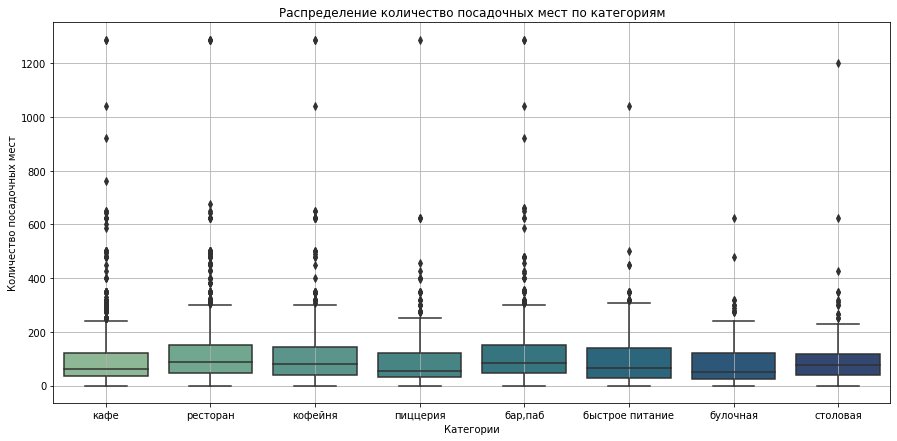

In [42]:
plt.figure(figsize=(15, 7))
sns.boxplot(x='category', y='seats', data=df, palette='crest') 
plt.title('Распределение количество посадочных мест по категориям')
plt.xlabel('Категории')
plt.ylabel('Количество посадочных мест')
plt.grid()
plt.show()

Уберем явные выбросы и посмотрим на данные поближе. Возьмем посадочные места от 650

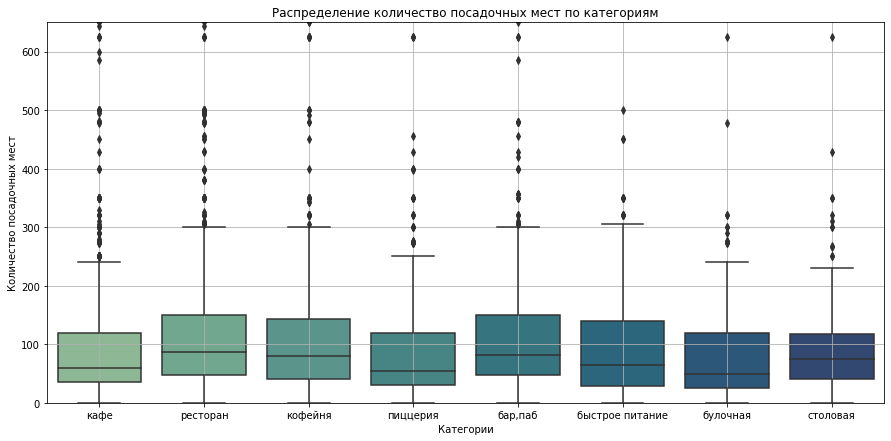

In [43]:
plt.figure(figsize=(15, 7))
sns.boxplot(x='category', y='seats', data=df, palette='crest') 
plt.title('Распределение количество посадочных мест по категориям')
plt.xlabel('Категории')
plt.ylabel('Количество посадочных мест')
plt.ylim(0, 650)
plt.grid()
plt.show()

In [44]:
# подсчитаем медиану посадочных мест по категориям
df.groupby('category')['seats'].median().sort_values(ascending=False).reset_index().round(2)

,category,seats
0,ресторан,86.0
1,"бар,паб",82.5
2,кофейня,80.0
3,столовая,75.5
4,быстрое питание,65.0
5,кафе,60.0
6,пиццерия,55.0
7,булочная,50.0


**Вывод**

Посадочных мест больше всего в ресторанах(1270) и самое большое медианное значение(86), далее идeт:
- кафе посадочных мест 1218, медиана одна из самых низких 60
- кофейня посадочных мест 751, медиана 80
- бар,паб посадочных мест 765, медиана 82,5

<a href='#start'>Вернуться к оглавлению</a>

<a id="step_3.3"></a>
### Рассмотреть соотношение сетевых и несетевых заведений в датасете

Исследуем, как распределены сетевые и несетевые объекты.

In [45]:
chain_group = df.groupby('chain')['name'].count().sort_values(ascending=False).reset_index()
chain_group.columns = ['chain', 'count']
chain_group

,chain,count
0,0,5201
1,1,3205


In [46]:
fig = px.pie(chain_group,
             values =  'count',
             names = chain_group['chain'].map({0:'Нет', 1:'Да'}),
             hole = 0.5,
             color_discrete_sequence = ['#2C3E50','#CACFD2'],
             title = 'Соотношение сетевых и несетевых заведений в датасете'
              )
        
fig.update_traces(textinfo='value + percent')
fig.show()

Сетевых объектов почти в два раза меньше   

Проверим, что в сетях действительно присутствуют несколько объектов.


In [47]:
chain_ob = df.query('chain == 1').groupby('name')['address'].count().reset_index()
chain_ob['address'].describe(percentiles=[0.05, 1/4, 1/2, 3/4, 0.95, 0.999])

count    746.000000
mean       4.296247
std        8.537130
min        1.000000
5%         1.000000
25%        2.000000
50%        2.000000
75%        3.000000
95%       13.750000
99.9%     87.220000
max      120.000000
Name: address, dtype: float64

In [48]:
chain_ob.head()


,name,address
0,1-я креветочная,1
1,10 идеальных пицц,3
2,18 грамм,3
3,4 сезона,1
4,7 сэндвичей,4


In [49]:
# сети, состоящие всего из одного объекта
len(chain_ob.query('address == 1'))

61

Более половины "сетей" состоят из всего 2-3 объектов, среднее количество точек в сети - 4, а максимальное - 120.  
Есть "сети", которые состоят всего лишь из 1 заведения - 61 шт

**Вывод**

В датасете сетевых объектов почти в два раза меньше:
сетевых - 3205 (38,1%0
несетевых - 5201 (61,9%)

Более половины "сетей" состоят из всего 2-3 объектов, среднее количество точек в сети - 4, а максимальное - 120.  
Есть "сети", которые состоят всего лишь из 1 заведения - 61 шт, несмотря на предварительную очистку названий объектов, количество "сетевых", но при этом одиночных точек, внушительное. Скорее всего, не все названия удалось привести к одинаковому формату, так, чтобы удалось их объединить, или, возможно, другие точки расположены не в Москве.  



<a href='#start'>Вернуться к оглавлению</a>

<a id="step_3.4"></a>
### Посмотрим какие категории заведений чаще являются сетевыми

In [50]:
chain_category = df.pivot_table(index = 'category', values='name', columns = 'chain', aggfunc='count').reset_index()
chain_category['total'] = chain_category[0] + chain_category[1]
chain_category['rate'] = chain_category[1] / chain_category['total']
chain_category = chain_category.sort_values(by='rate', ascending=False)
chain_category

chain,category,0,1,total,rate
1,булочная,99,157,256,0.613281
5,пиццерия,303,330,633,0.521327
4,кофейня,693,720,1413,0.509554
2,быстрое питание,371,232,603,0.384743
6,ресторан,1313,730,2043,0.357318
3,кафе,1599,779,2378,0.327586
7,столовая,227,88,315,0.279365
0,"бар,паб",596,169,765,0.220915


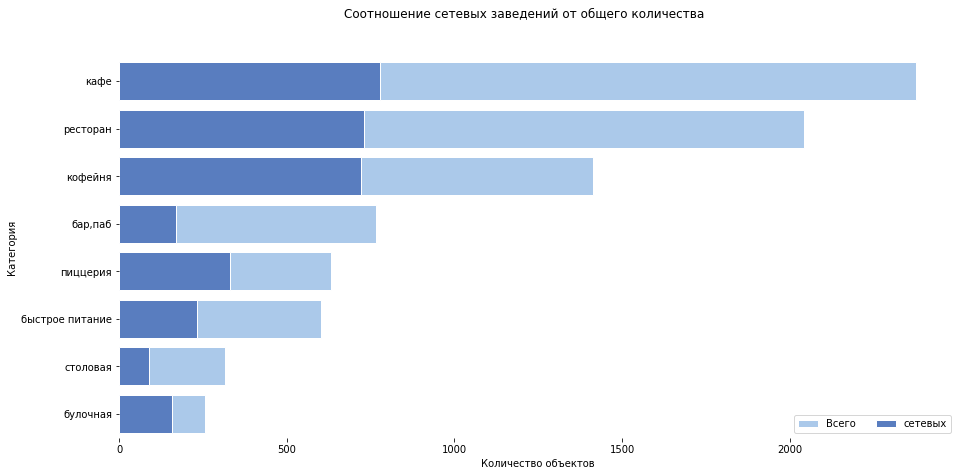

In [51]:
chain_category = chain_category.sort_values(by='total', ascending=False)
f, ax = plt.subplots(figsize = (15,7))
f.suptitle('Соотношение сетевых заведений от общего количества')
sns.set_color_codes('pastel')
sns.barplot(x = 'total', y = 'category', data = chain_category, 
            label = 'Всего', color = 'b', edgecolor = 'w')
sns.set_color_codes('muted')
sns.barplot(x = 1, y = 'category', data = chain_category,
            label = 'сетевых', color = 'b', edgecolor = 'w')
ax.legend(ncol = 2, loc = 'lower right')
ax.set(ylabel="Категория", xlabel="Количество объектов")
sns.despine(left = True, bottom = True)
plt.show()

**Вывод**

Чаще являются сетевыми: булочная(61,3%), пиццерия (52,1%) и кофейня (50,9).  

<a href='#start'>Вернуться к оглавлению</a>

<a id="step_3.5"></a>
### Топ-15 популярных сетей в Москве

In [52]:
# самые большие сети
chain_top = chain_ob.sort_values('address', ascending=False).head(15)
chain_top.columns= ['name','count']
chain_top

,name,count
730,шоколадница,120
335,домино'с пицца,76
331,додо пицца,74
146,one price coffee,71
743,яндекс лавка,69
58,cofix,65
168,prime,50
665,хинкальная,44
411,кофепорт,42
420,кулинарная лавка братьев караваевых,39


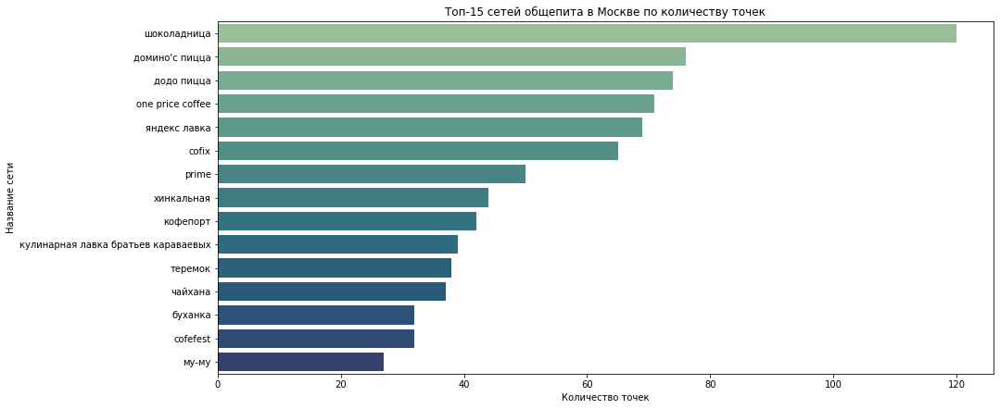

In [53]:
plt.figure(figsize=(15, 7))
sns.barplot(data=chain_top, y='name', x='count', palette='crest')
plt.title('Топ-15 сетей общепита в Москве по количеству точек')
plt.xlabel('Количество точек')
plt.ylabel('Название сети')
plt.show()

In [54]:
# посмотрим к какой категории относятся  эти заведения
chain_category = df.query('chain == 1').groupby(['name', 'category'])['address'].count().reset_index()
chain_category.columns= ['name','category','count']
chain_category.sort_values('count', ascending=False).head(15)

,name,category,count
1128,шоколадница,кофейня,119
496,домино'с пицца,пиццерия,76
489,додо пицца,пиццерия,74
205,one price coffee,кофейня,71
1144,яндекс лавка,ресторан,69
72,cofix,кофейня,65
241,prime,ресторан,49
620,кофепорт,кофейня,42
635,кулинарная лавка братьев караваевых,кафе,39
965,теремок,ресторан,36


In [55]:
fig = px.pie(chain_category,
             values =  'count',
             names = 'category',
             hole = 0.5,
             color_discrete_sequence = ['#2C3E50','#CACFD2'],
             title = 'Соотношение Топ-15 по категориям' )
        
fig.update_traces(textinfo='value + percent')
fig.show()

**Вывод**

Самые популярнык сети: шоколадница, домино пицца, додо пицца, one price coffee и яндекс лавка.
Топ-15 в большинстве своем относятся к 4 категориям: кофейня, пиццерия, ресторан, кафе
Некоторые из топа - это франшизы и это объединяет их.



<a href='#start'>Вернуться к оглавлению</a>

<a id="step_3.6"></a>
### Какие административные районы Москвы присутствуют в датасете

В данных представлены 9 административных районов.  
Посмотрим общее количество заведений и количество заведений каждой категории по районам

In [56]:
dis_category = df.pivot_table(index='district', columns ='category', values = 'name', aggfunc='count', margins=True)
dis_category = dis_category[:9]
dis_category.sort_values(by='All', ascending=False).reset_index()


category,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,All
0,Центральный административный округ,364,50,87,464,428,113,670,66,2242
1,Северный административный округ,68,39,58,235,193,77,189,41,900
2,Южный административный округ,68,25,85,264,131,73,202,44,892
3,Северо-Восточный административный округ,63,28,82,269,159,68,182,40,891
4,Западный административный округ,50,37,62,239,150,71,218,24,851
5,Восточный административный округ,53,25,71,272,105,72,160,40,798
6,Юго-Восточный административный округ,38,13,67,282,89,55,145,25,714
7,Юго-Западный административный округ,38,27,61,238,96,64,168,17,709
8,Северо-Западный административный округ,23,12,30,115,62,40,109,18,409


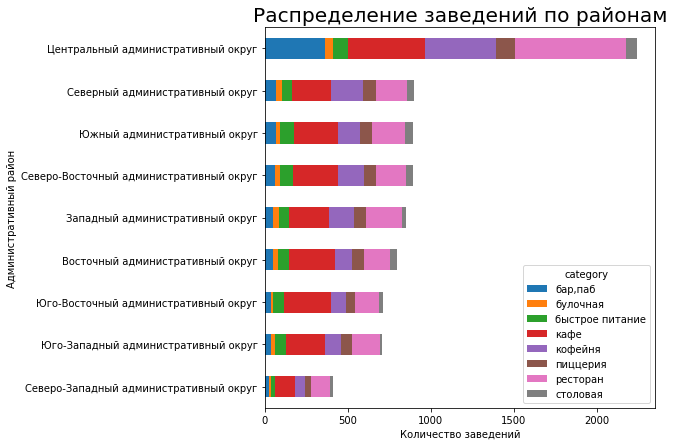

In [57]:
dis_category.sort_values('All').drop('All', axis=1).plot(kind='barh', stacked=True)
plt.style.use('fivethirtyeight')
plt.ylabel('Административный район')
plt.xlabel('Количество заведений')
plt.title('Распределение заведений по районам')
plt.gcf().set_size_inches(7,7)

plt.show()

**Вывод**

В данных представлены 9 административных районов.

Самые популярные заведения по районам:

||Административный район|Всего заведений |Топ-3 категорий | 
|:--:|:------------------------------:|:----:|:-----------:|
|1|Центральный административный округ |  2242  | ресторан, кафе, кофейня | 
|2|Северный административный округ |  900  | ресторан, кафе, кофейня | 
|3|Южный административный округ |  892  |  ресторан, кафе, кофейня| 
|4|Северо-Восточный административный округ |  891  | ресторан, кафе, кофейня | 
|5|Западный административный округ | 851  | ресторан, кафе, кофейня | 
|6|Восточный административный округ |  798  |  ресторан, кафе, кофейня| 
|7|Юго-Восточный административный округ |  714  |  ресторан, кафе, кофейня| 
|8|Юго-Западный административный округ |  709  |  ресторан, кафе, кофейня| 
|9|Северо-Западный административный округ|  409  | ресторан, кафе, кофейня | 


<a href='#start'>Вернуться к оглавлению</a>

<a id="step_3.7"></a>
### Распределение средних рейтингов по категориям заведений

In [58]:
category_rat = df.groupby('category')['rating'].mean().reset_index().sort_values(by='rating',ascending=False)
category_rat

,category,rating
0,"бар,паб",4.387712
5,пиццерия,4.301264
6,ресторан,4.290357
4,кофейня,4.277282
1,булочная,4.268359
7,столовая,4.211429
3,кафе,4.123886
2,быстрое питание,4.050249


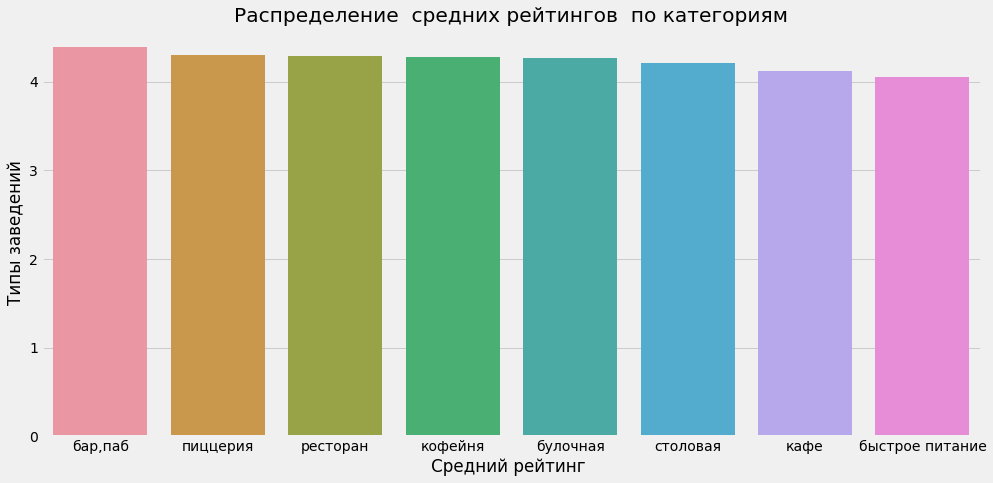

In [59]:
plt.figure(figsize=(15, 7))
sns.barplot(y='rating', x='category', data=category_rat)
plt.title('Распределение  средних рейтингов  по категориям')
plt.xlabel('Cредний рейтинг ')
plt.ylabel('Типы заведений')
plt.show()

**Вывод**

Усреднённые рейтинги в разных типах заведений не сильно отличаются друг от друга, диапазон от 4.1-4.4


<a href='#start'>Вернуться к оглавлению</a>

<a id="step_3.8"></a>
### Построим хороплет со средним рейтингом заведений каждого района




In [60]:
rating_df = df.groupby('district', as_index=False)['rating'].agg('mean').round(2)
rating_df

,district,rating
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
2,Северный административный округ,4.24
3,Северо-Восточный административный округ,4.15
4,Северо-Западный административный округ,4.21
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.10
7,Юго-Западный административный округ,4.17
8,Южный административный округ,4.18


In [61]:
# читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

In [62]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Purples',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Отобразить все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [63]:
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

**Вывод**

Средний рейтинг заведений каждого района не сильно отличается, на графике видно, что Центральный административный округ имеет самый высокий ср.рейтинг 4,38. 

Отобразили все заведения на графике, основная часть заведений находится в Центральном административном округе. Также на карте отобразилось  кафе, которое не вошло в кластер.


<a href='#start'>Вернуться к оглавлению</a>

<a id="step_3.9"></a>
### Топ-15 улиц по количеству заведений

In [64]:
df.groupby('street')['name'].count().sort_values(ascending=False).head(15)

street
проспект Мира             184
Профсоюзная улица         122
проспект Вернадского      108
Ленинский проспект        107
Ленинградский проспект     95
Дмитровское шоссе          88
Каширское шоссе            77
Варшавское шоссе           76
Ленинградское шоссе        70
МКАД                       65
Люблинская улица           60
улица Вавилова             55
Кутузовский проспект       54
улица Миклухо-Маклая       49
Пятницкая улица            48
Name: name, dtype: int64

In [65]:
street_category = df.pivot_table(index='street', columns ='category', values = 'name', aggfunc='count', margins=True)
street_category = street_category.sort_values(by='All', ascending=False).head(16)
street_category = street_category[1:]
street_category

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,All
street,,,,,,,,,
проспект Мира,12.0,4.0,21.0,53.0,36.0,11.0,45.0,2.0,184
Профсоюзная улица,6.0,4.0,15.0,35.0,18.0,15.0,26.0,3.0,122
проспект Вернадского,7.0,1.0,12.0,25.0,16.0,12.0,33.0,2.0,108
Ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0,107
Ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0,95
Дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0,88
Каширское шоссе,2.0,NaN,10.0,20.0,16.0,5.0,19.0,5.0,77
Варшавское шоссе,6.0,NaN,7.0,18.0,14.0,4.0,20.0,7.0,76
Ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0,70


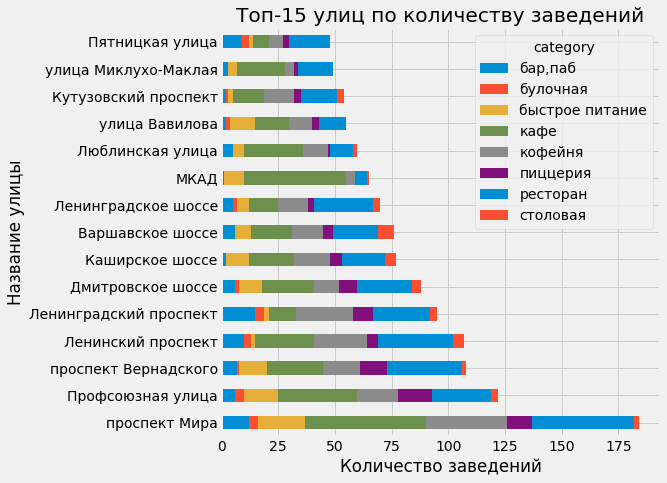

In [66]:
street_category.drop('All', axis=1).plot(kind='barh', stacked=True)
plt.style.use('fivethirtyeight')
plt.ylabel('Название улицы')
plt.xlabel('Количество заведений')
plt.title('Топ-15 улиц по количеству заведений')
plt.gcf().set_size_inches(7,7)
plt.show()

In [67]:
a = df.pivot_table(index=['street','district'], columns ='category', values = 'name', aggfunc='count', margins=True).reset_index()
a = a.sort_values(by='All', ascending=False).head(16)
a = a[1:]
a.sort_values(by='district', ascending=False)

category,street,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,All
468,Каширское шоссе,Южный административный округ,2.0,NaN,10.0,20.0,16.0,5.0,19.0,5.0,77
304,Варшавское шоссе,Южный административный округ,6.0,NaN,7.0,18.0,14.0,4.0,20.0,7.0,76
804,Профсоюзная улица,Юго-Западный административный округ,6.0,4.0,15.0,35.0,18.0,15.0,26.0,3.0,122
542,Ленинский проспект,Юго-Западный административный округ,5.0,2.0,2.0,18.0,18.0,5.0,15.0,1.0,66
1349,улица Миклухо-Маклая,Юго-Западный административный округ,3.0,NaN,4.0,21.0,4.0,2.0,15.0,NaN,49
566,Люблинская улица,Юго-Восточный административный округ,5.0,NaN,5.0,26.0,11.0,1.0,10.0,2.0,60
1128,проспект Мира,Центральный административный округ,3.0,1.0,5.0,12.0,17.0,3.0,11.0,NaN,52
812,Пятницкая улица,Центральный административный округ,9.0,3.0,2.0,7.0,6.0,3.0,18.0,NaN,48
1127,проспект Мира,Северо-Восточный административный округ,9.0,3.0,16.0,41.0,19.0,8.0,34.0,2.0,132
173,Алтуфьевское шоссе,Северо-Восточный административный округ,5.0,1.0,5.0,13.0,9.0,3.0,10.0,1.0,47


**Вывод**

Топ-15 улиц по количеству заведений у нас из разных округов, также самые распространенные категории: кафе, ресторан, кофейня

В топ  попали крупные и длинные «вылетные магистрали», идущие от центра города ко МКАД.


<a href='#start'>Вернуться к оглавлению</a>

<a id="step_3.10"></a>
### Найдем улицы, на которых находится только один объект общепита

In [68]:
one_place_on_street = df.pivot_table(index=['street'], values='name', aggfunc='count').reset_index().sort_values(by = 'name', ascending=False)
one_place_on_street = one_place_on_street.query('name ==1')
one_place_on_street = list(one_place_on_street['street'])


In [69]:
df_street = df.query('street in @one_place_on_street')
df_street.head(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
15,дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица Бусиновская Горка,False
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,неизвестно,NaN,NaN,NaN,0,NaN,Прибрежный проезд,False
25,в парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,неизвестно,NaN,NaN,NaN,1,NaN,парк Левобережный,False


In [70]:
#посмотрим сколько из них сетевых
df_street['chain'].value_counts()

0    325
1    133
Name: chain, dtype: int64

In [71]:
#посмотрим какой тип заведения преобладает
df_street.groupby('category')['name'].count().reset_index()

,category,name
0,"бар,паб",39
1,булочная,8
2,быстрое питание,23
3,кафе,160
4,кофейня,84
5,пиццерия,15
6,ресторан,93
7,столовая,36


Больше одиночных кафе строят

In [72]:
# Посмотрим в каком районе и какой тип заведения преобладает
df_street.pivot_table(index = 'district', columns = 'category', values = 'name',  aggfunc='count', margins=True).reset_index()

category,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,All
0,Восточный административный округ,2.0,NaN,7.0,18.0,7.0,6.0,7.0,5.0,52
1,Западный административный округ,4.0,2.0,3.0,13.0,2.0,2.0,8.0,1.0,35
2,Северный административный округ,2.0,2.0,1.0,20.0,13.0,1.0,7.0,6.0,52
3,Северо-Восточный административный округ,2.0,NaN,3.0,16.0,10.0,3.0,14.0,7.0,55
4,Северо-Западный административный округ,1.0,NaN,1.0,4.0,3.0,NaN,8.0,2.0,19
5,Центральный административный округ,23.0,2.0,3.0,38.0,34.0,2.0,36.0,7.0,145
6,Юго-Восточный административный округ,5.0,NaN,1.0,20.0,6.0,1.0,4.0,2.0,39
7,Юго-Западный административный округ,NaN,1.0,2.0,9.0,4.0,NaN,1.0,1.0,18
8,Южный административный округ,NaN,1.0,2.0,22.0,5.0,NaN,8.0,5.0,43
9,All,39.0,8.0,23.0,160.0,84.0,15.0,93.0,36.0,458


Преобладают улицы в Центральном административном округе

**Вывод**

Нашли 458 улиц, на которых находится только один объект общепита.   
Эти улицы расположены в разных районах, но больше их в Центральном административном округе (145).  
Категории заведений преобладают: кафе, кофейня, ресторан
Чаще это одиночные заведения (325), но и присутствуют сетевые (133), возможно, сеть по разным городам расположена или ошибки в данных  



<a href='#start'>Вернуться к оглавлению</a>

<a id="step_3.11"></a>
### Выяснить как удалённость от центра влияет на цены в заведениях

In [73]:
dist_bill = df.groupby('district')['middle_avg_bill'].median().reset_index().sort_values(by='middle_avg_bill',ascending=False)
dist_bill

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [74]:
# создаём карту Москвы
n = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=dist_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Purples',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(n)

# выводим карту
n

In [75]:
# Посмотрим средний чек по категориям 
df_bill =  df.groupby('category')['middle_avg_bill'].mean().reset_index().round(2)
df_bill.sort_values(by='middle_avg_bill', ascending=False)

,category,middle_avg_bill
6,ресторан,1367.88
0,"бар,паб",1338.76
5,пиццерия,789.38
3,кафе,707.75
1,булочная,658.77
4,кофейня,614.21
2,быстрое питание,445.76
7,столовая,335.35


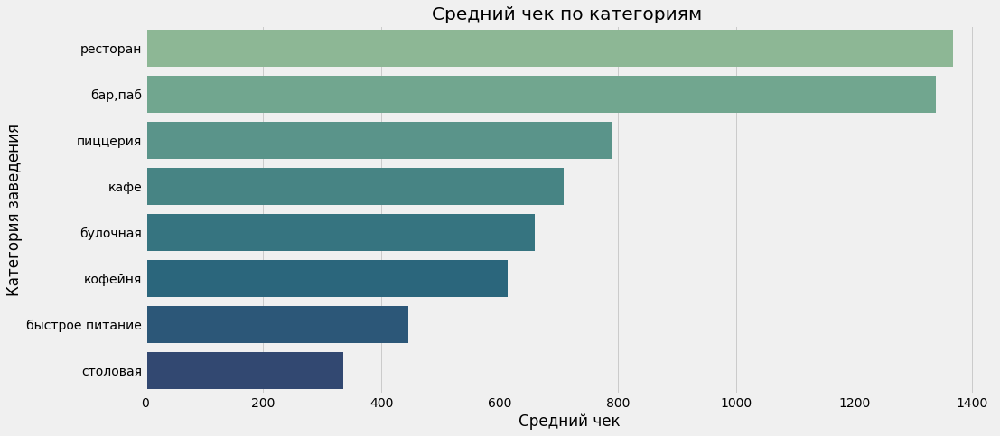

In [76]:
plt.figure(figsize=(15, 7))
sns.barplot(data=df_bill.sort_values('middle_avg_bill', ascending=False), y='category', x='middle_avg_bill', palette='crest')
plt.title('Средний чек по категориям ')
plt.xlabel('Средний чек')
plt.ylabel('Категория заведения')
plt.show()

**Вывод**

Самый высокий средний чек в центральном административном округе и Западном административном округе,
В восточных округах цены значительно ниже, скорее всего, из-за того, что в эти районы больше жилые, там меньше бизнес центров и развитой инфраструктуры.  

Средний чек выше у ресторанов, паб, бар, пиццерии и кафе


<a href='#start'>Вернуться к оглавлению</a>

<a id="step_3.12"></a>
### Исследуем часы работы заведений и их зависимость от расположения и категории заведения

In [77]:
#Посмотрим топ-5 самых популярных рабочих часов по категориям
df_hours = (df.pivot_table(index='hours', columns='category', values='name', aggfunc='count',margins=True)
            .reset_index().sort_values(by = 'All', ascending=False).head(6))
df_hours = df_hours[1:]
df_hours

category,hours,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,All
168,"ежедневно, 10:00–22:00",14.0,11.0,144.0,172.0,140.0,83.0,192.0,3.0,759
275,"ежедневно, круглосуточно",52.0,24.0,150.0,267.0,59.0,31.0,135.0,12.0,730
276,неизвестно,18.0,7.0,33.0,375.0,15.0,5.0,74.0,9.0,536
213,"ежедневно, 11:00–23:00",42.0,1.0,18.0,108.0,4.0,48.0,175.0,NaN,396
175,"ежедневно, 10:00–23:00",24.0,3.0,18.0,75.0,14.0,81.0,94.0,1.0,310


In [78]:
#Посмотрим топ-5 самых популярных рабочих часов по расположению
dist_hours = df.pivot_table(index='hours', columns='district', values='name', aggfunc='count',margins=True).reset_index().sort_values(by = 'All', ascending=False).head(6)
dist_hours = dist_hours[1:]
dist_hours

district,hours,Восточный административный округ,Западный административный округ,Северный административный округ,Северо-Восточный административный округ,Северо-Западный административный округ,Центральный административный округ,Юго-Восточный административный округ,Юго-Западный административный округ,Южный административный округ,All
168,"ежедневно, 10:00–22:00",59.0,77.0,97.0,121.0,28.0,110.0,74.0,73.0,120.0,759
275,"ежедневно, круглосуточно",97.0,72.0,71.0,75.0,43.0,131.0,93.0,73.0,75.0,730
276,неизвестно,75.0,66.0,54.0,61.0,40.0,31.0,85.0,59.0,65.0,536
213,"ежедневно, 11:00–23:00",38.0,42.0,49.0,48.0,21.0,97.0,33.0,33.0,35.0,396
175,"ежедневно, 10:00–23:00",29.0,32.0,59.0,27.0,14.0,69.0,24.0,28.0,28.0,310


**Вывод**

Самые популярные часы работы: ежедневно, 10:00–22:00 и круглосуточно

Часы работы по категориям: 

||Категория|Часы работы  |
|:--:|:----------------:|:----:|
|1| кафе   |  ежедневно, круглосуточно	    |
|2|ресторан   |ежедневно, 10:00–22:00     |
|3| кофейня   |  ежедневно, 10:00–22:00   | 
|4| бар,паб	   | ежедневно, круглосуточно	   |
|5| пиццерия   |ежедневно, 10:00–22:00	   |
|6|быстрое питание|ежедневно, круглосуточно | 
|7| столовая   | ежедневно, круглосуточно   |
|8|булочная   |  ежедневно, круглосуточно   | 

Часы работы по районам: 

||district|	Часы работы|
|:--:|:------------------------------:|:----:|
1|	Западный административный округ|	ежедневно, 10:00–22:00	|
5|	Центральный административный округ	|ежедневно, круглосуточно|
4	|Северо-Западный административный округ|	ежедневно, круглосуточно|
2|	Северный административный округ|	ежедневно, 10:00–22:00	|
7|	Юго-Западный административный округ|	ежедневно, круглосуточно|
0|	Восточный административный округ	|ежедневно, круглосуточно|
3|	Северо-Восточный административный округ	|ежедневно, 10:00–22:00	|
8|	Южный административный округ	|ежедневно, 10:00–22:00
6|	Юго-Восточный административный округ	|ежедневно, круглосуточно|


<a href='#start'>Вернуться к оглавлению</a>

<a id="step_3.13"></a>
### Исследовать особенности заведений с плохими рейтингами    

Исследовать средние чеки в таких местах и распределение по категориям заведений


In [79]:
# Посмотрим топ-10 заведений с плохими рейтингами (меньше 3)

df_rat = (df.query('rating < 3')
                .groupby('category')['rating'].agg(['count','mean']).reset_index().sort_values(by='count',ascending=False)
               )
df_rat 

,category,count,mean
3,кафе,107,2.240187
6,ресторан,32,2.068750
2,быстрое питание,31,2.277419
4,кофейня,16,2.406250
0,"бар,паб",8,1.887500
5,пиццерия,8,2.450000
7,столовая,6,1.983333
1,булочная,2,1.750000


**Вывод**

Больше всего заведений с плохими рейтингами: кафе, ресторан и быстрое питание


<a href='#start'>Вернуться к оглавлению</a>

<a id="step_3_end"></a>
### Вывод

В ходе анализа выяснили следующее:

* Из анализа распределение заведений по категориям общественного питания к количеству выявлено, что наибольшее количество объектов кафе (2378), ресторан (2043), кофейня(1413), а наименьшее количество у столовых (315) и булочных (256).


||Категория|Количество  |seats | seats(median) | несетевой | сетевой| % сетевых |
|:--:|:----------------:|:----:|:-------------:|:-----:|:-----:|:-----:|:-----:|
|1| кафе   |   2378     |1218 |  60            | 1599    | 779     | 32,7    |
|2|ресторан   |2043     |1270 |    86          | 1313    | 730     | 35,7    |
|3| кофейня   |  1413   | 751 |    80          | 693      |  720   | 50,9    |
|4| бар,паб	   | 765    |468  |     82.5       | 596      | 169    |22,1     | 
|5| пиццерия   |633     |427   |    55         |  303     |   330   | 52,1   |
|6|быстрое питание|603  | 349 |      65        |  371    |  232    |  38,5   |
|7| столовая   | 315    | 164 |    75.5        | 227      |  88    | 27,9    |
|8|булочная   |  256    | 148 |     50         |  99     |   157   | 61,3    |



* В датасете сетевых объектов почти в два раза меньше: сетевых - 3205 (38,1%0 несетевых - 5201 (61,9%)

* Более половины "сетей" состоят из всего 2-3 объектов, среднее количество точек в сети - 4, а максимальное - 120. Есть "сети", которые состоят всего лишь из 1 заведения - 61 шт, несмотря на предварительную очистку названий объектов, количество "сетевых", но при этом одиночных точек, внушительное. Скорее всего, не все названия удалось привести к одинаковому формату, так, чтобы удалось их объединить, или, возможно, другие точки расположены не в Москве.

* Чаще являются сетевыми: булочная(61,3%), пиццерия (52,1%) и кофейня (50,9).  
* Самые популярнык сети: шоколадница, домино пицца, додо пицца, one price coffee и яндекс лавка.  Топ-15 популярных сетей в большинстве своем относятся к 4 категориям: кофейня, пиццерия, ресторан, кафе Некоторые из топа - это франшизы и это объединяет их.  

* В данных представлены 9 административных районов.

  Самые популярные заведения по районам:

||Административный район|Всего заведений |Топ-3 категорий | 
|:--:|:------------------------------:|:----:|:-----------:|
|1|Центральный административный округ |  2242  | ресторан, кафе, кофейня | 
|2|Северный административный округ |  900  | ресторан, кафе, кофейня | 
|3|Южный административный округ |  892  |  ресторан, кафе, кофейня| 
|4|Северо-Восточный административный округ |  891  | ресторан, кафе, кофейня | 
|5|Западный административный округ | 851  | ресторан, кафе, кофейня | 
|6|Восточный административный округ |  798  |  ресторан, кафе, кофейня| 
|7|Юго-Восточный административный округ |  714  |  ресторан, кафе, кофейня| 
|8|Юго-Западный административный округ |  709  |  ресторан, кафе, кофейня| 
|9|Северо-Западный административный округ|  409  | ресторан, кафе, кофейня | 


* Усреднённые рейтинги в разных типах заведений не сильно отличаются друг от друга, диапазон от 4.1-4.4  
  Средний рейтинг заведений каждого района не сильно отличается, на графике видно, что Центральный административный округ имеет самый высокий ср.рейтинг 4,38.  

* Отобразили все заведения на графике, основная часть заведений находится в Центральном административном округе. 

* Топ-15 улиц по количеству заведений у нас из разных округов, также самые распространенные категории: кафе, ресторан, кофейня
* Нашли 458 улиц, на которых находится только один объект общепита.
   Эти улицы расположены в разных районах, но больше их в Центральном административном округе (145).
  Категории заведений преобладают: кафе, кофейня, ресторан Чаще это одиночные заведения (325), но и присутствуют сетевые (133),   возможно, сеть по разным городам расположена или ошибки в данных

* Средний чек заведений по районам:
  Самый высокий средний чек в центральном административном округе и Западныом административном округе, В восточных округах цены значительно ниже, скорее всего, из-за того, что в эти районы больше жилые, там меньше бизнес центров и развитой инфраструктуры.
||district|	middle_avg_bill|
|:--:|:------------------------------:|:----:|
1|	Западный административный округ|	1000.0|
5|	Центральный административный округ	|1000.0|
4	|Северо-Западный административный округ|	700.0|
2|	Северный административный округ|	650.0|
7|	Юго-Западный административный округ|	600.0|
0|	Восточный административный округ	|575.0|
3|	Северо-Восточный административный округ	|500.0|
8|	Южный административный округ	|500.0
6|	Юго-Восточный административный округ	|450.0|
* Средний чек выше у ресторанов, маб, бар, пеццерии и кафе
* Самые популярные часы работы: ежедневно, 10:00–22:00 и круглосуточно

* Больше всего заведений с плохими рейтингами: кафе, ресторан и быстрое питание

<a href='#start'>Вернуться к оглавлению</a>

<a id="step_4"></a>
## Детализируем исследование: открытие кофейни


<a id="step_4.1"></a>
### Выяснить сколько всего кофеен в датасете

Определить в каких районах их больше всего, каковы особенности их расположения.


In [80]:
#Посмотрим какой % занимают кофейни в данных
df_category['%'] = (df_category['count'] / df_category['count'].sum()*100).round(2)
df_category

,category,count,%
0,кафе,2378,28.29
1,ресторан,2043,24.30
2,кофейня,1413,16.81
3,"бар,паб",765,9.10
4,пиццерия,633,7.53
5,быстрое питание,603,7.17
6,столовая,315,3.75
7,булочная,256,3.05


In [81]:
fig = px.pie(df_category,
             values =  'count',
             names = 'category',
             hole = 0.5,
             color_discrete_sequence = ['#2C3E50','#CACFD2'],
             title = 'Распределение заведений в датасете' )
        
fig.update_traces(textinfo='value + percent')
fig.show()

Кофейни занимают третье место, как самая популярная категория заведений

In [82]:
# посмотрим сводную по районам
dis_category

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,All
district,,,,,,,,,
Восточный административный округ,53,25,71,272,105,72,160,40,798
Западный административный округ,50,37,62,239,150,71,218,24,851
Северный административный округ,68,39,58,235,193,77,189,41,900
Северо-Восточный административный округ,63,28,82,269,159,68,182,40,891
Северо-Западный административный округ,23,12,30,115,62,40,109,18,409
Центральный административный округ,364,50,87,464,428,113,670,66,2242
Юго-Восточный административный округ,38,13,67,282,89,55,145,25,714
Юго-Западный административный округ,38,27,61,238,96,64,168,17,709
Южный административный округ,68,25,85,264,131,73,202,44,892


In [83]:
# посмотрим рближе распределение кофеен по районам
dis_coffe = dis_category.reindex(columns = ['кофейня']).reset_index()
dis_coffe.sort_values(by='кофейня', ascending = False)

category,district,кофейня
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


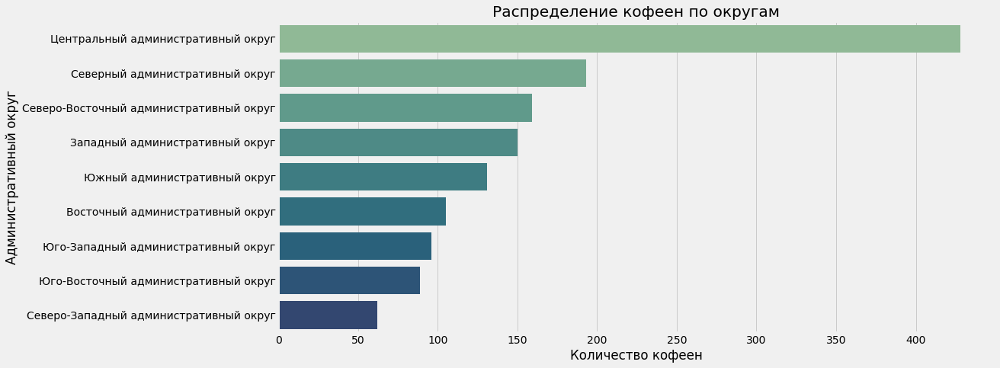

In [84]:
plt.figure(figsize=(15, 7))
sns.barplot(data=dis_coffe.sort_values('кофейня', ascending=False), y='district', x='кофейня', palette='crest')
plt.title('Распределение кофеен по округам')
plt.xlabel('Количество кофеен')
plt.ylabel('Административный округ')
plt.show()

Кофеен больше всего в Центрально административном округе

Посмотрим расположение кофеен

In [85]:
# создаём карту Москвы
c = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster_cof = MarkerCluster().add_to(c)

# пишем функцию, которая принимает строку датафрейма,

# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster_cof)

# применяем функцию create_clusters() к каждой строке датафрейма
df.query('category=="кофейня"').apply(create_clusters, axis=1)

# выводим карту
c

In [86]:
#посмотрим каких кофеен больше сетевых или нет

df.query('category=="кофейня"').groupby('chain')['name'].count().sort_values(ascending=False).reset_index()

,chain,name
0,1,720
1,0,693


**Вывод**

По распротраннености кофейни занимают третье место (17%) от всех данных.  
Больше всего кофеен в в Центрально административном округе.  
Примерно одинаковое количество сетевых и несетевых кофеен.  



<a href='#start'>Вернуться к оглавлению</a>

<a id="step_4.2"></a>
### Узнать есть ли круглосуточные кофейни

In [87]:
hours_coffe= df_hours.reindex(columns = ['hours','кофейня']).reset_index()
hours_coffe['%'] = (hours_coffe['кофейня'] / hours_coffe['кофейня'].sum()*100).round(2)

hours_coffe.sort_values(by='кофейня', ascending = False)

category,index,hours,кофейня,%
0,168,"ежедневно, 10:00–22:00",140.0,60.34
1,275,"ежедневно, круглосуточно",59.0,25.43
2,276,неизвестно,15.0,6.47
4,175,"ежедневно, 10:00–23:00",14.0,6.03
3,213,"ежедневно, 11:00–23:00",4.0,1.72


**Вывод**

Самые популярные часы работы кофеен:  
ежедневно, 10:00–22:00	 - 60%  
ежедневно, круглосуточно - 25,4%  

<a href='#start'>Вернуться к оглавлению</a>

<a id="step_4.3"></a>
### Узнать какие у кофеен рейтинги? Как они распределяются по районам?

In [88]:
rating_coffe = df.query('category=="кофейня"').groupby('district', as_index=False)['rating'].agg('mean').round(2)
rating_coffe.sort_values(by='rating', ascending = False)

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
0,Восточный административный округ,4.28
7,Юго-Западный административный округ,4.28
6,Юго-Восточный административный округ,4.23
8,Южный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.20


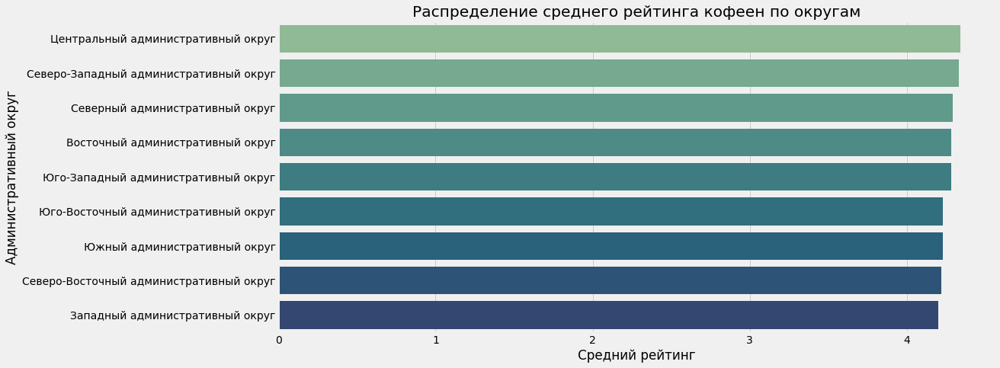

In [89]:
plt.figure(figsize=(15, 7))
sns.barplot(data=rating_coffe.sort_values('rating',ascending=False), y='district', x='rating', palette='crest')
plt.title('Распределение среднего рейтинга кофеен по округам')
plt.xlabel('Средний рейтинг')
plt.ylabel('Административный округ')
plt.show()

**Вывод**

Средний рейтинг кофеен по округам примерно одинаковый, в диапазоне от 4,2-4,3


<a href='#start'>Вернуться к оглавлению</a>

<a id="step_4.4"></a>
### Определить на какую стоимость чашки капучино стоит ориентироваться при открытии

In [90]:
coffee_cup = df.query('category=="кофейня"').groupby('district', as_index=False)['middle_coffee_cup'].agg('mean').round(2)
coffee_cup.sort_values(by='middle_coffee_cup', ascending = False)

,district,middle_coffee_cup
1,Западный административный округ,189.94
5,Центральный административный округ,187.52
7,Юго-Западный административный округ,184.18
0,Восточный административный округ,174.02
2,Северный административный округ,165.79
4,Северо-Западный административный округ,165.52
3,Северо-Восточный административный округ,165.33
8,Южный административный округ,158.49
6,Юго-Восточный административный округ,151.09


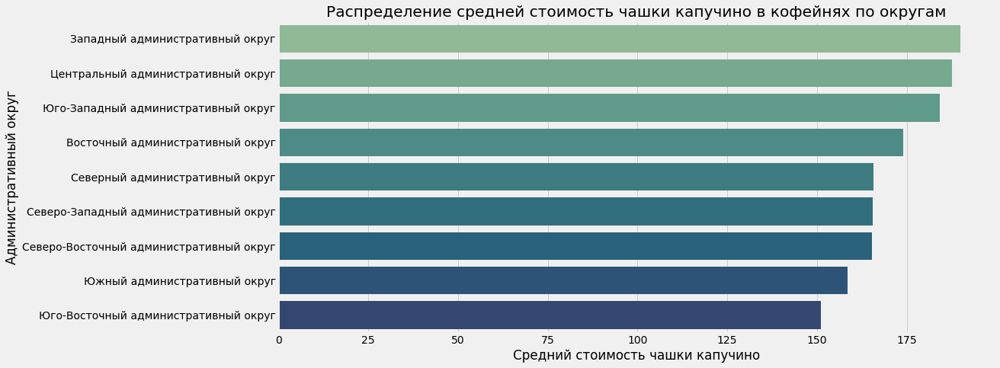

In [91]:
plt.figure(figsize=(15, 7))
sns.barplot(data=coffee_cup.sort_values('middle_coffee_cup',ascending=False), y='district', x='middle_coffee_cup', palette='crest')
plt.title('Распределение средней стоимость чашки капучино в кофейнях по округам')
plt.xlabel('Средний стоимость чашки капучино')
plt.ylabel('Административный округ')
plt.show()

In [92]:
#Посмотрим как сколько в других заведениях стоит чашка кофе
df_cup = df.groupby('category', as_index=False)['middle_coffee_cup'].agg('mean').round(2)
df_cup.sort_values(by='middle_coffee_cup', ascending = False)

,category,middle_coffee_cup
0,"бар,паб",208.33
4,кофейня,175.06
5,пиццерия,153.33
2,быстрое питание,140.00
3,кафе,105.50
1,булочная,NaN
6,ресторан,NaN
7,столовая,NaN


In [93]:
#посмотрим на средний чек 
coffee_bill = df.query('category=="кофейня"').groupby('district', as_index=False)['middle_avg_bill'].agg('mean').round(2)
coffee_bill.sort_values(by='middle_avg_bill', ascending = False)

,district,middle_avg_bill
5,Центральный административный округ,794.76
1,Западный административный округ,694.44
8,Южный административный округ,504.78
2,Северный административный округ,495.74
0,Восточный административный округ,486.11
4,Северо-Западный административный округ,440.64
3,Северо-Восточный административный округ,433.16
7,Юго-Западный административный округ,381.82
6,Юго-Восточный административный округ,263.00


In [94]:
#посмотрим на ср. кол-во посадочных мест по районам

coffee_seats = df.query('category=="кофейня"').groupby('district', as_index=False)['seats'].agg('median').round(2)
coffee_seats.sort_values(by='seats', ascending = False)

,district,seats
1,Западный административный округ,96.0
4,Северо-Западный административный округ,87.5
5,Центральный административный округ,86.0
8,Южный административный округ,80.0
3,Северо-Восточный административный округ,75.0
2,Северный административный округ,66.0
7,Юго-Западный административный округ,64.5
0,Восточный административный округ,55.0
6,Юго-Восточный административный округ,50.0


**Вывод**

При открытие кофейни стоит ориентироваться, на среднюю стоимость чашки капучино по регионам: от 151 до 190 руб, в ср 175 руб.  
Средний чек варьируется в зависимости от региона от 263-795 руб  
Посадочных мест в среднем кофейня	111.20, а медиана по регионам от 50-96 по округам  

<a href='#start'>Вернуться к оглавлению</a>

<a id="step_4_end"></a>
### Вывод

Анализ кофеен:

* По распространнености кофейни занимают третье место (17%) от всех данных.  
* Больше всего кофеен в в Центрально административном округе.  
* Примерно одинаковое количество сетевых и несетевых кофеен.  
* Самые популярные часы работы кофеен:  
  ежедневно, 10:00–22:00	 - 60%  
  ежедневно, круглосуточно - 25,4%  
* Средний рейтинг кофеен по округам примерно одинаковый, в диапазоне от 4,2-4,3
* При открытие кофейни стоит ориентироваться, на среднюю стоимость чашки капучино по регионам: от 151 до 190 руб, в ср 175р.   
* Средний чек варьируется в зависимости от региона от 263-795 руб
* Посадочных мест в среднем от 50-96 по округам

<a href='#start'>Вернуться к оглавлению</a>

<a id="step_5"></a>
## Презентация 

Презентация: <https://docs.google.com/presentation/d/1A79alLoKBjr2obk6j_hlPRy72LbJoYiM-oAK1iR3G7M/edit?usp=share_link>


<a href='#start'>Вернуться к оглавлению</a>

<a id="step_6"></a>
## Общий вывод

Было проведено исследование рынка Москвы, чтобы  найти интересные особенности, , которые в будущем помогут в выборе подходящего инвесторам места.  
В нашем распоряжении датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.  

Изучили и проанализировали данные:

* В датасете представлены данные из 8406 строки и 14 столбцов, из них уникальных названий заведений 5614. В данныех присутствуют пропуски - 6 столбцов(не заполняли). Явные дубликаты отсутствуют. Добавили дополнительные столбцы для анализа
* Из анализа распределение заведений по категориям общественного питания к количеству выявлено, что наибольшее количество объектов кафе (2378), ресторан (2043), кофейня(1413), а наименьшее количество у столовых (315) и булочных (256).
* В датасете сетевых объектов почти в два раза меньше: сетевых - 3205 (38,1%0 несетевых - 5201 (61,9%)

* Более половины "сетей" состоят из всего 2-3 объектов, среднее количество точек в сети - 4, а максимальное - 120. Есть "сети", которые состоят всего лишь из 1 заведения - 61 шт, несмотря на предварительную очистку названий объектов, количество "сетевых", но при этом одиночных точек, внушительное. Скорее всего, не все названия удалось привести к одинаковому формату, так, чтобы удалось их объединить, или, возможно, другие точки расположены не в Москве.

* Чаще являются сетевыми: булочная(61,3%), пиццерия (52,1%) и кофейня (50,9).  
* Самые популярнык сети: шоколадница, домино пицца, додо пицца, one price coffee и яндекс лавка.  Топ-15 популярных сетей в большинстве своем относятся к 4 категориям: кофейня, пиццерия, ресторан, кафе Некоторые из топа - это франшизы и это объединяет их.  

* В данных представлены 9 административных районов, в каждом округе больше всего открывают: кафе, рестораны и кофейни  
* Усреднённые рейтинги в разных типах заведений не сильно отличаются друг от друга, диапазон от 4.1-4.4  
  Средний рейтинг заведений каждого района не сильно отличается, на графике видно, что Центральный административный округ имеет самый высокий ср.рейтинг 4,38.  
* Отобразили все заведения на графике, основная часть заведений находится в Центральном административном округе. 

* Топ-15 улиц по количеству заведений у нас из разных округов, также самые распространенные категории: кафе, ресторан, кофейня
* Нашли 458 улиц, на которых находится только один объект общепита.
   Эти улицы расположены в разных районах, но больше их в Центральном административном округе (145).
  Категории заведений преобладают: кафе, кофейня, ресторан Чаще это одиночные заведения (325), но и присутствуют сетевые (133),   возможно, сеть по разным городам расположена или ошибки в данных

* Средний чек заведений по районам:
  Самый высокий средний чек в центральном административном округе и Западныом административном округе, В восточных округах цены значительно ниже, скорее всего, из-за того, что в эти районы больше жилые, там меньше бизнес центров и развитой инфраструктуры.
  
* Самые популярные часы работы: ежедневно, 10:00–22:00 и круглосуточно

* Больше всего заведений с плохими рейтингами: кафе, ресторан и быстрое питание

Детальнее изучили особенности кофеен:

* По распространнености кофейни занимают третье место (17%) от всех данных.  
* Больше всего кофеен в в Центрально административном округе.  
* Примерно одинаковое количество сетевых и несетевых кофеен.  
* Самые популярные часы работы кофеен:  
  ежедневно, 10:00–22:00	 - 60%  
  ежедневно, круглосуточно - 25,4%  
* Средний рейтинг кофеен по округам примерно одинаковый, в диапазоне от 4,2-4,3
* При открытие кофейни стоит ориентироваться, на среднюю стоимость чашки капучино по регионам: от 151 до 190 руб, в ср 175р.   
* Средний чек варьируется в зависимости от региона от 263-795 руб
* Посадочных мест в среднем от 50-96 по округам

Рекомендации:   
Так как кофейня и кафе не сильно отличаются друг от друга, рекомендую обратить внимание на кафе, так как:

* Средний чек в кафе выше на 15%, однако посадочных мест меньше, в кафе медианное значение 60 (кофейня 80), что может быть связано с тем, что кофейни чаще посещают одинокие люди или которые пришли поработать. В кафе обычно приходят компанией, семьей и за одним столом людей больше.
* Самих кафе больше, что говорит о популярности данного заведения (28,3%),а кофеен (16,8%)  
* Стоимость чашки кофе в кафе ниже (105 кафе, 175 в кофейне), но в кафе обычно разнообразнее меню и шире выбор напитков   
* Очень много сетевых кофеен (50%), что говорит о занятости рынка, кафе сетевых намного меньше (32%)  
* В понравившееся кафе люди возвращаются , чаще с компанией, его можно снять на праздник, провести свадьбу, что в кофейне не проводят  
* Засчет меню, кафе может привлекать дополнительный клиентов, устраивая акции, неделя какой-то кухни и тд, в кофейне ассортимент ограниченнее.
* Самый популярный формат можно рассмотреть: круглосуточное кафе
* Районы для размещения: Восточный административный округ (низкий ср.чек) или Западный административный округ(высокий ср чек, место большой проходимости)


<a href='#start'>Вернуться к оглавлению</a>